In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' # no info or warning, only error
import pathlib
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE

from IPython.display import display, clear_output

# **The Trumpifyer**
## **Solving Intellectual Inequality by Making Everyone Look Stupid**

### A final project by Daniel, Emily, and Franca

Within this final project of the course "Deep Learning in Python" at the University of Amsterdam, we dived into the topic of generative deep learning techniques and implemented the Trumpifyer, a CycleGAN architecture that learned the mapping between ordinary human faces to trump images and hence can translate, or trumpify, any given face image into a trump-looking creature.

# Table of Contents

1. [Introduction](#intro)
2. [Methods](#methods) <br /> 
    2.1 [The data: Trump & celebrity faces](#thedata) <br /> 
    2.2 [The model: The Cycle GAN Architecture](#model)
3. [Results](#results)
4. [Conclusion](#conclusion)

<a id="intro"></a>
# **1. Introduction**

Generative Adversarial Networks (GANs) are a deep learning approach to generative modeling (Goodfellow et al., 2014). While supervised learning is most commonly used in machine learning, it requires extensive paired training examples (Goodfellow et al., 2020). In contrast, generative models are a form of unsupervised learning that aim to learn the probability distribution underlying the training examples and, thereby, require a smaller sample size for learning. GANs do so by simultaneously training two competing networks: a generator $G$ which captures the underlying distribution of the real data and generates new samples, and a discriminator $D$ whose task consists of deciding whether a sample originated from the real distribution or from the generator. This can be seen as a two player game in which each player tries to minimize their own cost. The goal becomes to find a local minimum for each player, in which the cost of both players cannot be reduced any further, also known as a Nash equilibrium. More recently, Zhu and colleagues (Zhu et al., 2017) have proposed CycleGAN as a solution for unpaired image-to-image translation, where the aim is to learn a mapping from one image domain to the other, and vice versa. Therefore, the CycleGAN architecture incorporates two generators, each learning the mapping from one image domain to the other, and two discriminators, one for each image domain. While Zhu and colleagues only presented examples of image-to-image translations between domains characterized by obvious distinguishable features (e.g. horses and zebras), we were interested in how this model would perform when using more “subtle” facial features.

In the following we will first elaborate on our extended preprocessing pipeline. Then, we will explain the CycleGAN architecture and present our implementation. Lastly, we will discuss our results and provide some concluding remarks on the challenges we faced.


<a id="methods"></a>
# **2. Methods**
​
### ***Disclaimer***
​
We first ran the model with a random subsample with $N = 3000$ of the CelebA dataset (Liu et al., 2015) and a high resolution Trump dataset containing $N = 3020$ samples we found on Kaggle ([Trump photos](https://www.kaggle.com/datasets/mbkinaci/trump-photos)). As becomes evident from the examples of translated images below, the model did not appear to have learned the trump-like facial features we had hoped for. This might have been due to the fact that the Trump dataset we used contained rather unstructured image data, in the sense that it included images of different angles and perspectives often containing noisy background information and sometimes even other people. Thus, we decided to extend the preprocessing pipeline.


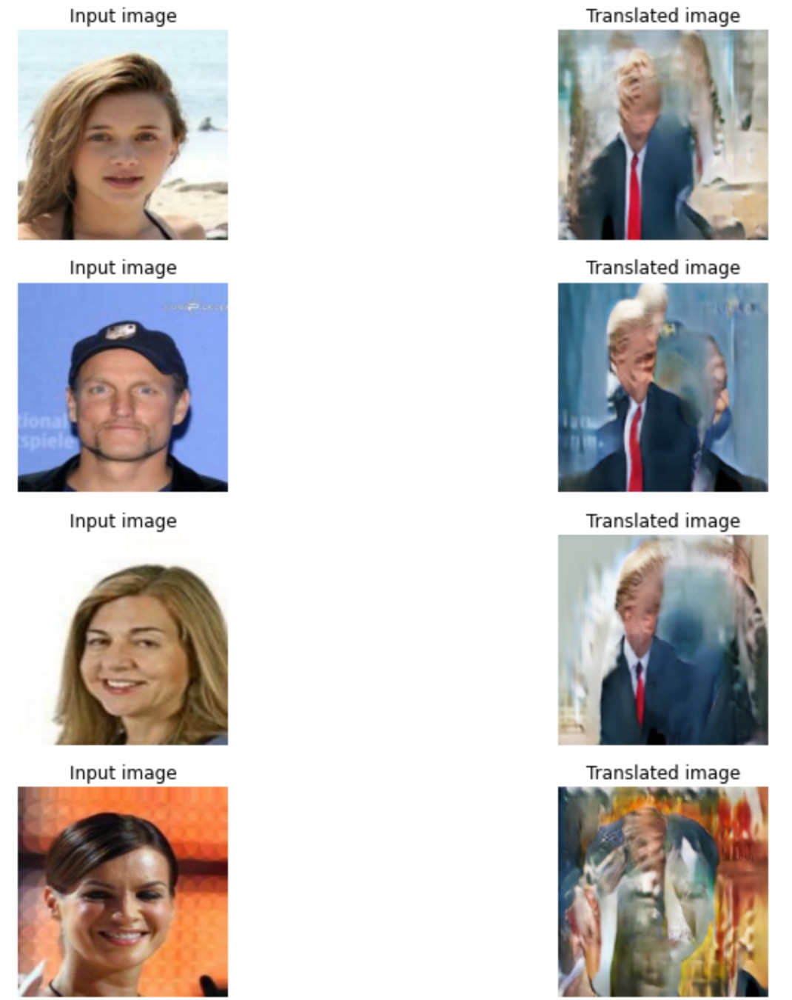

<a id="thedata"></a>
## **2.1 The data**

### **Data import**

For efficiency reasons, the data was prepared in our separate [pre-processing pipeline Kaggle notebook](https://www.kaggle.com/code/frding/dl-pre-processing-for-the-trumpifyer), including face detection, cropping, and augmentation. The output of this pre-processing pipeline was stored as a [Kaggle dataset](https://kaggle.com/datasets/a2f283da6741dfea047ba365e88a1b9a4257d16a046a250c759435a158ab6101) (featuring two folders: celebs and Trump) and used as input for this notebook.

**To summarise:**

- **Pre-processing of the Trump pictures**: In an attempt to extract the images containing only frontal-faces and thereby allowing for a better mapping between image domains, we decided to apply face detection and cropping to the original Trump dataset we found on Kaggle ([Trump photos](https://www.kaggle.com/datasets/mbkinaci/trump-photos)). Face detection used two pretrained classifiers, one for frontal faces and one for eyes. The classifiers used were 'Haar Feature-based Cascade Classifiers', which extract line and edge features from images of faces (or eyes) during training. Hence, all images were selected that contained the combination of all the pre-specified features. This, however, resulted in a considerable loss of samples (84,64 %), shrinking out initial 3020 trump samples to a staggering 444. In order to increase sample size, we decided to merge the resulting face trump images with another trump dataset we found on Kaggle containing only cropped Trump faces which however had considerably lower resolution ([Donald Trump Face Images](https://www.kaggle.com/datasets/yilingliu610/donald-trump-face-images)). Furthermore, we performed flipping as a data augmentation technique. As the Trumpifyer was intended to generate normal looking faces, data augmentation had to be applied with caution: we only flipped the pictures horizontally as this should retain the position of the most relevant features while still enlarging the data set. This resulted in a data set of $N=4306$ images.


- **Pre-processing of the celebrities pictures**: The CelebA dataset consisted of $N=202599$ images ([CelebFaces Attributes (CelebA) Dataset](https://www.kaggle.com/datasets/jessicali9530/celeba-dataset)). To match the sample size and image cropping of the Trump images, a random sample of only $N=4000$ celebrity images was used, to which face detection was also applied.


For more details, we refer the reader to the [pre-processing notebook](https://www.kaggle.com/code/frding/dl-pre-processing-for-the-trumpifyer).

In [2]:
# specify path
data_dir_celeb = pathlib.Path("/kaggle/input/facesforthetrumpifyer/celeb-photos")
data_dir_trump = pathlib.Path("/kaggle/input/facesforthetrumpifyer/trump-photos")

# count data sets
image_count_celeb = len(list(data_dir_celeb.glob('*.jpg')))
image_count_trump = len(list(data_dir_trump.glob('*.jpg')))

print("\nNr. of celebrity images:", image_count_celeb)
print("Nr. of Trump images:", image_count_trump)


Nr. of celebrity images: 4000
Nr. of Trump images: 4306


### **Train/Validation Data Split**

We split both datasets in a training and a validation set. For the CelebA dataset we used $N=3800$ images for training and $N=200$ images for validation. For the Trump dataset we used $N=4091$ images for training and $N=215$ images for validation. 

In [3]:
# Relevant parameters for the following split
batch_size = 1
img_height = 256
img_width = 256

In [4]:
# Prepare celeb dataset
train_celeb = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_celeb,
    batch_size = batch_size,
    label_mode=None,
    image_size=(img_height, img_width), 
    seed=123,
    validation_split=0.05,
    subset="training",                
).map(lambda x: (x/127.5)-1) # normalize image 

test_celeb = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_celeb,
    batch_size = batch_size,
    label_mode=None,
    image_size=(img_height, img_width), 
    seed=123,
    validation_split=0.05,
    subset="validation",
).map(lambda x: (x/127.5)-1) # normalize image 

Found 4000 files belonging to 1 classes.
Using 3800 files for training.
Found 4000 files belonging to 1 classes.
Using 200 files for validation.


In [5]:
# Prepare trump dataset
train_trump = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_trump,
    batch_size = batch_size,
    label_mode=None,
    image_size=(img_height, img_width), 
    seed=123,
    validation_split=0.05,
    subset="training",
).map(lambda x: (x/127.5)-1) # normalize image 

test_trump = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_trump,
    batch_size = batch_size,
    label_mode=None,
    image_size=(img_height, img_width), 
    seed=123,
    validation_split=0.05,
    subset="validation",
).map(lambda x: (x/127.5)-1) # normalize image 

Found 4306 files belonging to 1 classes.
Using 4091 files for training.
Found 4306 files belonging to 1 classes.
Using 215 files for validation.


### **Visualise training samples**

The exemplary pictures of both datasets nicely show the similarity due to the cropping. However, they also depict the expected differences in image resolution. 

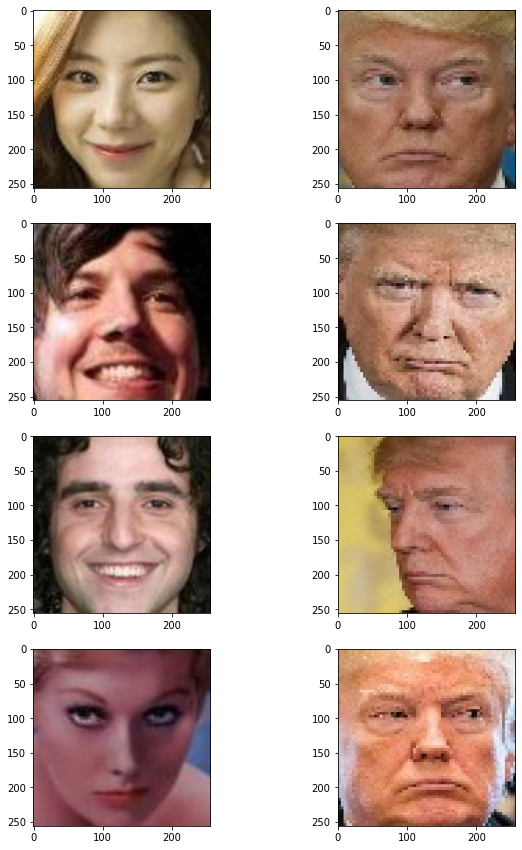

In [6]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_celeb.take(4), train_trump.take(4))):
    celeb = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    trump = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(celeb)
    ax[i, 1].imshow(trump)
plt.show()

<a id="model"></a>
## **2.2 The Model: The Cycle GAN Architecture**

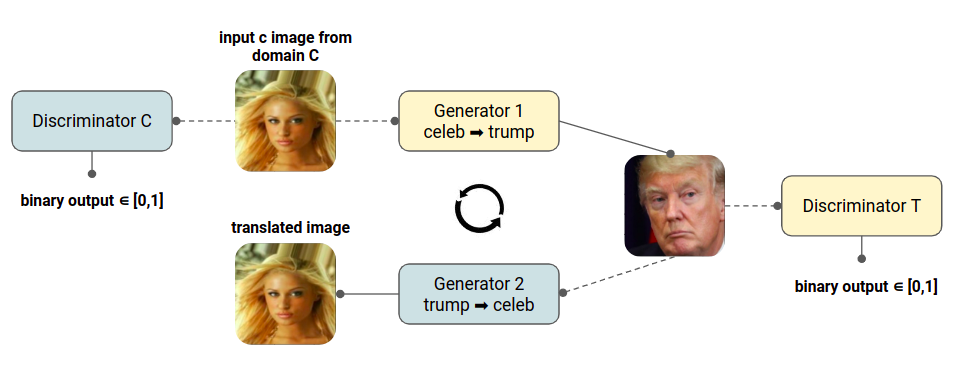

The CycleGAN can be used for image-to-image translation, where the goal is to learn the mapping between two image domains. More specifically, in our case, we want to learn the mapping between images $c$ of the CelebA dataset $C$ and images $t$ of the Trump dataset $T$. We do this by training two generators $G_{t \rightarrow c}$ and $G_{c \rightarrow t}$ as well as two discriminators $D_{T}$ and $D_{C}$. Our goal then becomes that the distribution of a translated **celeb2trump** image $G_{c \rightarrow t}(c)$ is indistinguishable from the distribution of images $t \in T$, and vice versa, that the distribution of a translated **trump2celeb** image $G_{t \rightarrow c}(t)$ resembles the distribution of images $c \in C$ as close as possible. Hence, we want to build a model that can turn a celebrity image $c$ into an image $\hat{t}$ which looks as though it could be part of the Trump dataset $T$, or in other words, that ***trumpifies*** celebrety images. In the CycleGAN architecture, this is achieved via the idea of ***cycle consistency***, meaning that we aim to be able to input e.g. a sample $c$, apply $G_{c \rightarrow t}$ to generate an image $\hat{t}$, then apply $G_{t \rightarrow c}$ and get a generated image $\hat{c}$ which should be as similar to the original image $c$ as possible. 

The CycleGAN model incorporates three loss terms. 
- The adversarial loss for the first generator-discriminator pair: $L_{GAN}(G_{t \rightarrow c}, D_{C}, T, C) = \frac{1}{m} \sum_{}^{} (1 - D_{C}(G_{t \rightarrow c}(t)))^2$  
- The adversarial loss for the second generator-discriminator pair: $L_{GAN}(G_{c \rightarrow t}, D_{T}, T, C) = \frac{1}{m} \sum_{}^{} (1 - D_{T}(G_{c \rightarrow t}(c)))^2$ 
- The cycle consistency loss: $L_{cyc}(G_{t \rightarrow c},G_{c \rightarrow t}) = [(G_{c \rightarrow t}(G_{t \rightarrow c}(t)) - t) + (G_{t \rightarrow c}(G_{c \rightarrow t}(c)) - c)]$

In total, the models objective function thus becomes a combination of two adversarial losses for each generator-discriminator pair which are the standard GAN losses, and a cycle consistency loss. This amounts to the following objective: 

$$
  L(G_{t \rightarrow c},G_{c \rightarrow t}, D_{T}, D_{C}) = L_{GAN}(G_{t \rightarrow c}, D_{C}, T, C) \\
  + L_{GAN}(G_{c \rightarrow t}, D_{T}, T, C) \\
  + \lambda L_{cyc}(G_{t \rightarrow c},G_{c \rightarrow t})
$$ 

where $\lambda$ controls the relative importance of the two objectives. We then aim to solve: 

$$
  G_{t \rightarrow c}*,G_{c \rightarrow t}* = arg min_{G_{t \rightarrow c},G_{c \rightarrow t}} max_{D_{T}, D_{C}} L(G_{t \rightarrow c}, G_{c \rightarrow t}, D_{T}, D_{C})
$$


In [7]:
input_img_size = (256, 256, 3)

# Weights initializer for the layers
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

# Gamma initializer for instance normalization
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

In [8]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

### **The Generators**

In [9]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

### **The Discriminators**



In [10]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

### **Setting up the Cycle GAN Model**

In [11]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):

        super(CycleGan, self).__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity
        self._set_inputs(inputs=self.gen_G.inputs, outputs=self(self.gen_F.inputs)) #Added this so the model saving works

    def call(self, inputs): #Added this so the model saving works
        return self.gen_F(self.gen_G(inputs))
    
    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super(CycleGan, self).compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is celeb and y is Trump
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adverserial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # celeb to fake Trump
            fake_y = self.gen_G(real_x, training=True)
            # Trump to fake celeb -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (celeb to fake Trump to fake celeb): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Trump to fake celeb to fake Trump) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

### **Creating a Callback** ***(periodically saves generated images)***

In [12]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_celeb.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.preprocessing.image.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

### **Train the end-to-end Model**

Following the paper by Zhu et al., 2017, we used $\lambda = 10$, the Adam solver with a batch size of 1, and a learning rate of 0.0002. Because of limited computational capacity we were not able to run the model for 200 epochs as in the original paper, and ran it for only 30 epochs instead. We decided to visualise the output of all 30 epochs below in order to show the progress made per epoch.

Epoch 1/30
3800/3800 [==============================] - 1419s 357ms/step - G_loss: 2.8956 - F_loss: 2.9965 - D_X_loss: 0.1909 - D_Y_loss: 0.1914


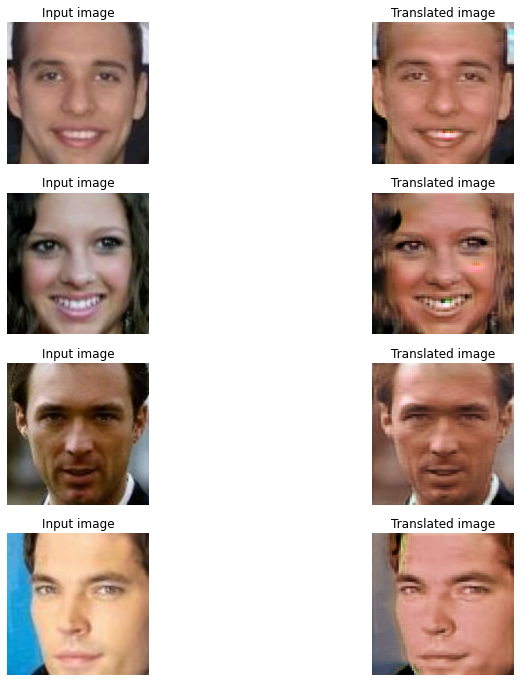

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/30
3800/3800 [==============================] - 1357s 357ms/step - G_loss: 2.5108 - F_loss: 2.4663 - D_X_loss: 0.2075 - D_Y_loss: 0.2019


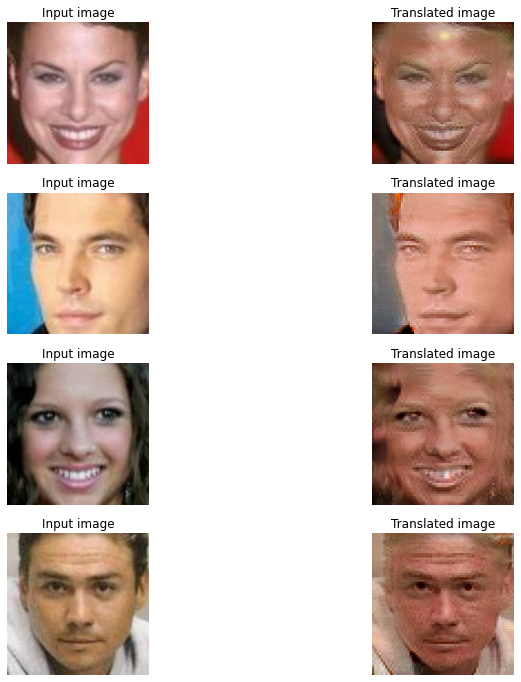

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 3/30
3800/3800 [==============================] - 1353s 356ms/step - G_loss: 2.5168 - F_loss: 2.2521 - D_X_loss: 0.2189 - D_Y_loss: 0.1680


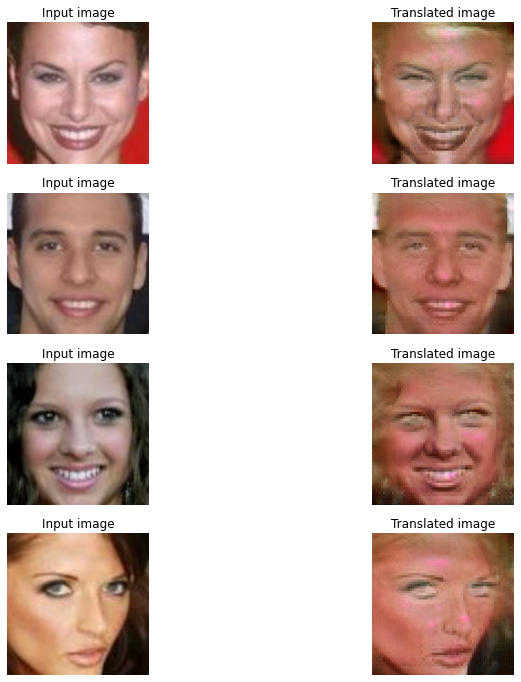

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 4/30
3800/3800 [==============================] - 1352s 356ms/step - G_loss: 2.7804 - F_loss: 2.1573 - D_X_loss: 0.2248 - D_Y_loss: 0.0973


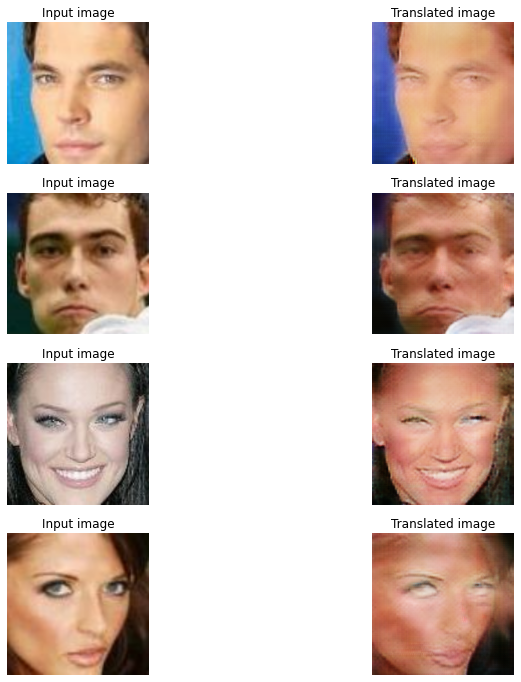

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 5/30
3800/3800 [==============================] - 1356s 357ms/step - G_loss: 2.7503 - F_loss: 2.1214 - D_X_loss: 0.2252 - D_Y_loss: 0.0822


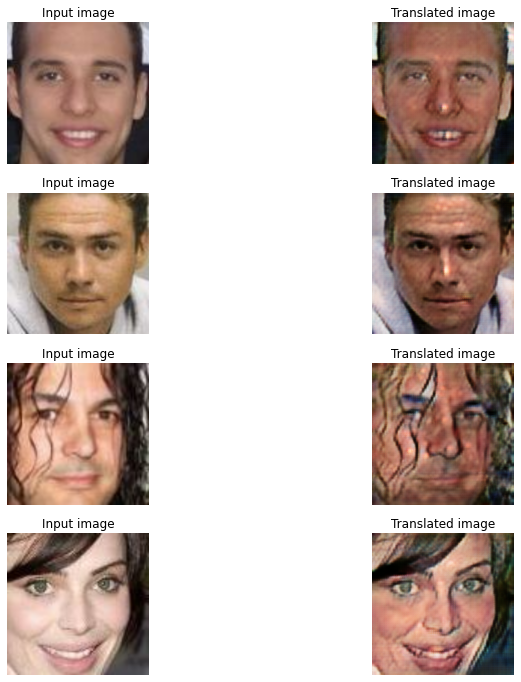

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 6/30
3800/3800 [==============================] - 1360s 358ms/step - G_loss: 2.6178 - F_loss: 2.0632 - D_X_loss: 0.2287 - D_Y_loss: 0.0845


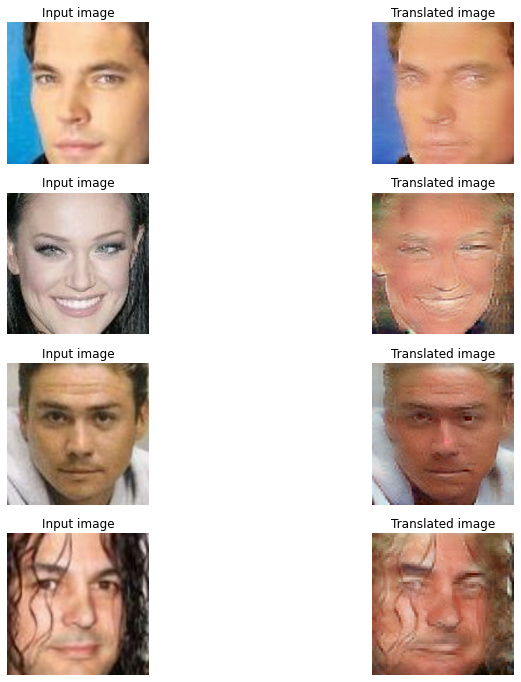

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 7/30
3800/3800 [==============================] - 1360s 358ms/step - G_loss: 2.5168 - F_loss: 1.9557 - D_X_loss: 0.2298 - D_Y_loss: 0.0839


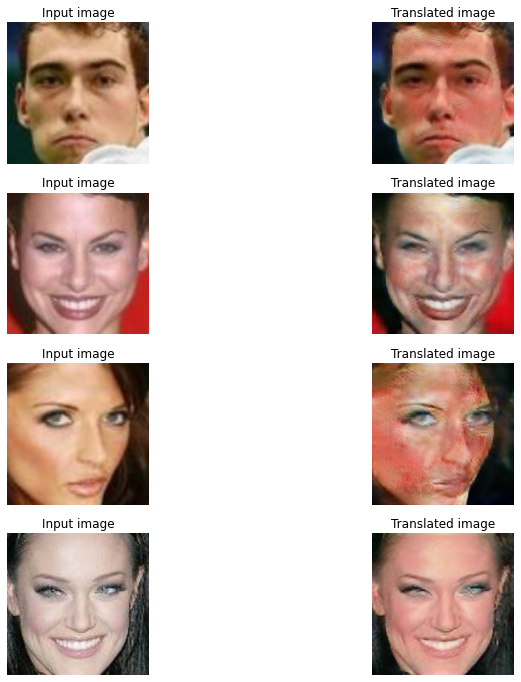

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 8/30
3800/3800 [==============================] - 1360s 358ms/step - G_loss: 2.4521 - F_loss: 1.9251 - D_X_loss: 0.2303 - D_Y_loss: 0.0879


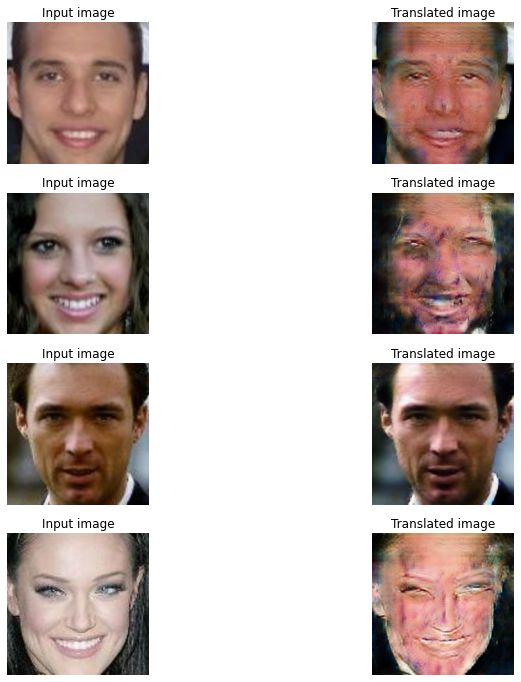

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 9/30
3800/3800 [==============================] - 1359s 358ms/step - G_loss: 2.4259 - F_loss: 1.9045 - D_X_loss: 0.2285 - D_Y_loss: 0.0800


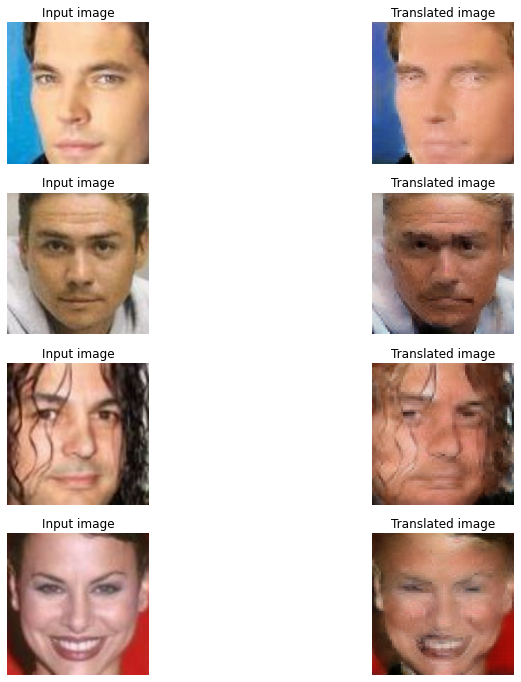

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 10/30
3800/3800 [==============================] - 1360s 358ms/step - G_loss: 2.3674 - F_loss: 1.8526 - D_X_loss: 0.2297 - D_Y_loss: 0.0859


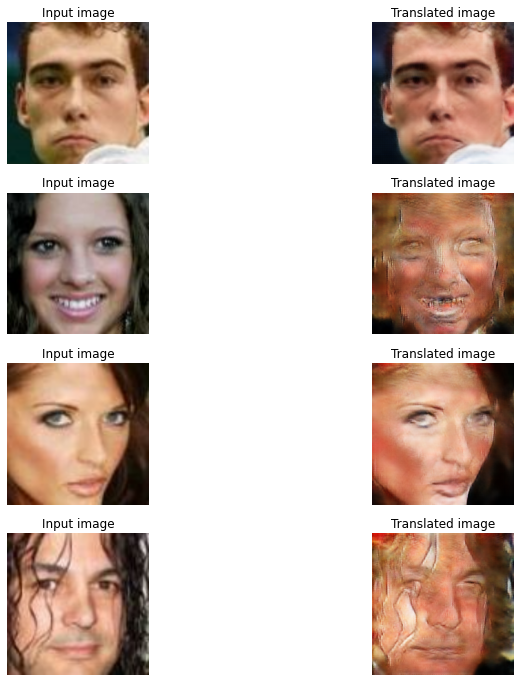

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 11/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.3442 - F_loss: 1.8024 - D_X_loss: 0.2288 - D_Y_loss: 0.0857


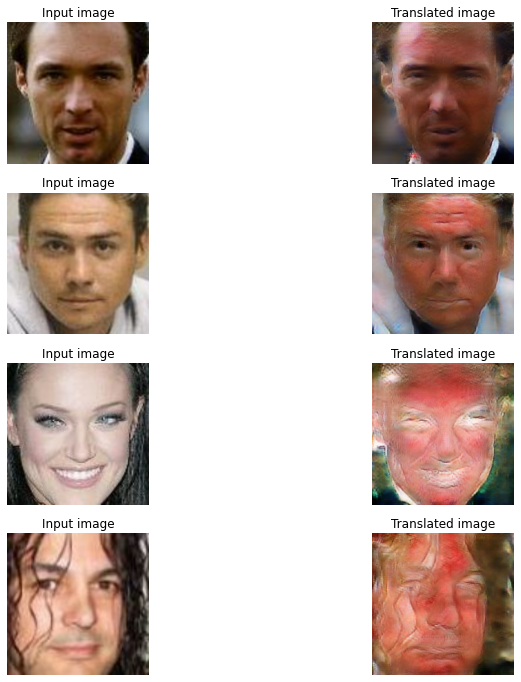

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 12/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.2873 - F_loss: 1.8011 - D_X_loss: 0.2239 - D_Y_loss: 0.0850


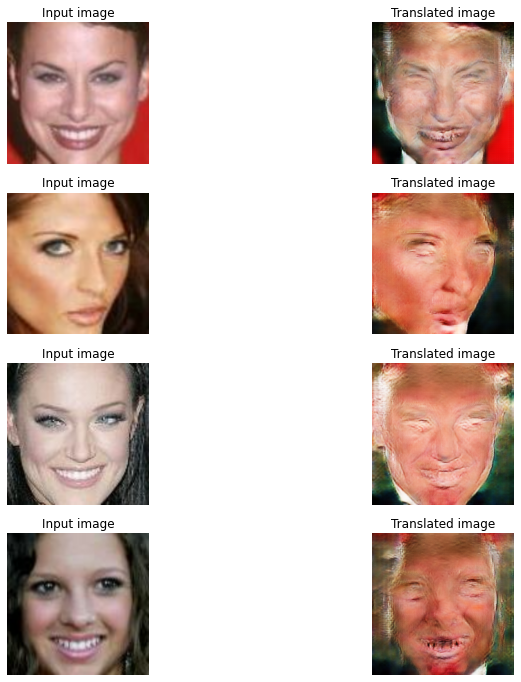

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 13/30
3800/3800 [==============================] - 1363s 359ms/step - G_loss: 2.2888 - F_loss: 1.8202 - D_X_loss: 0.2066 - D_Y_loss: 0.0841


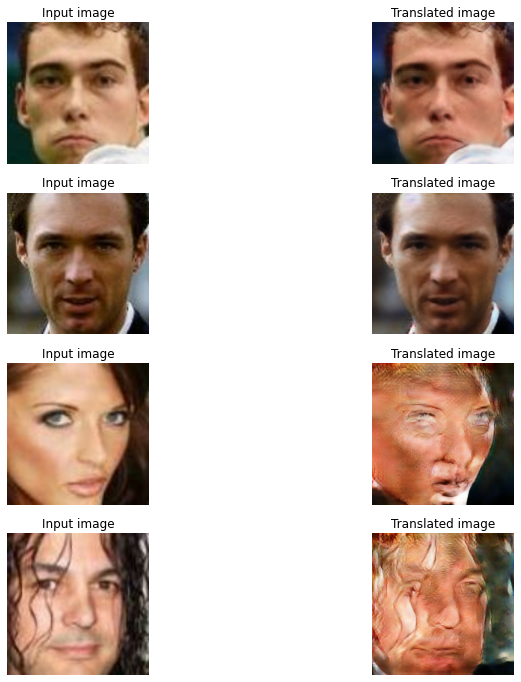

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 14/30
3800/3800 [==============================] - 1363s 359ms/step - G_loss: 2.2809 - F_loss: 1.8767 - D_X_loss: 0.1886 - D_Y_loss: 0.0828


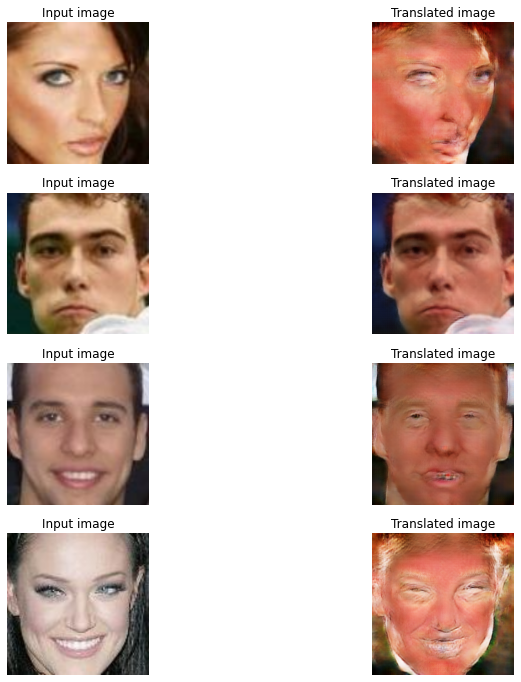

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 15/30
3800/3800 [==============================] - 1363s 359ms/step - G_loss: 2.2953 - F_loss: 1.8908 - D_X_loss: 0.1849 - D_Y_loss: 0.0825


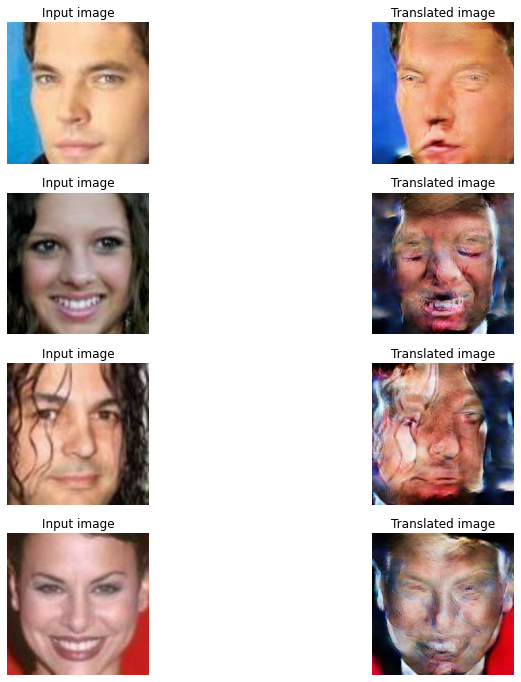

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 16/30
3800/3800 [==============================] - 1364s 359ms/step - G_loss: 2.2917 - F_loss: 1.9065 - D_X_loss: 0.1880 - D_Y_loss: 0.0821


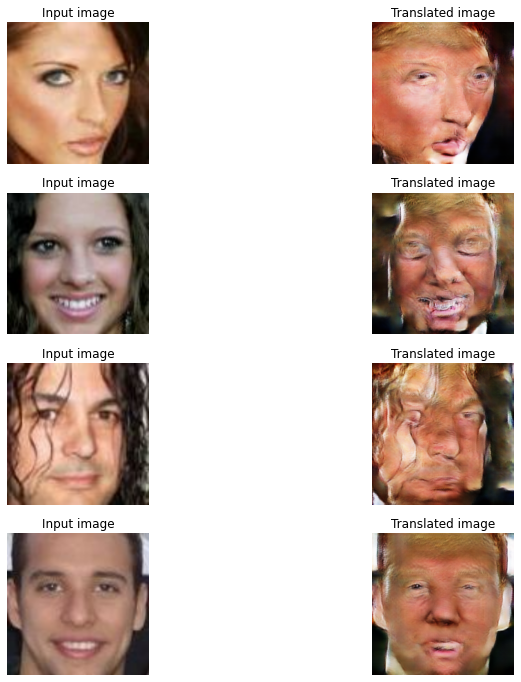

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 17/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.2722 - F_loss: 1.9028 - D_X_loss: 0.1898 - D_Y_loss: 0.0817


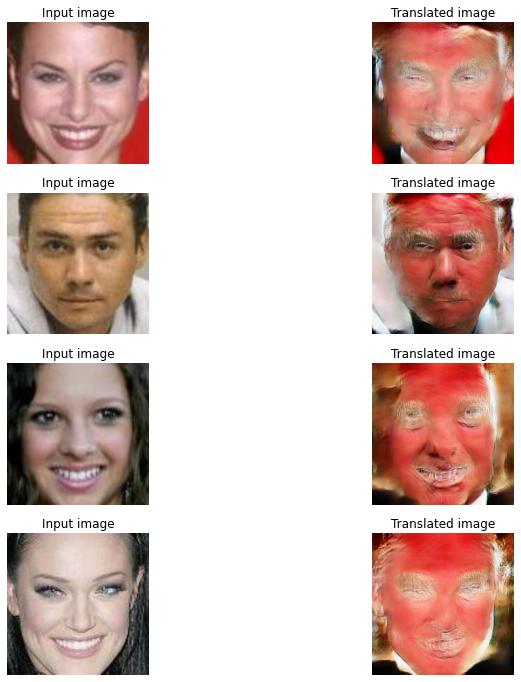

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 18/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.2412 - F_loss: 1.9017 - D_X_loss: 0.1881 - D_Y_loss: 0.0813


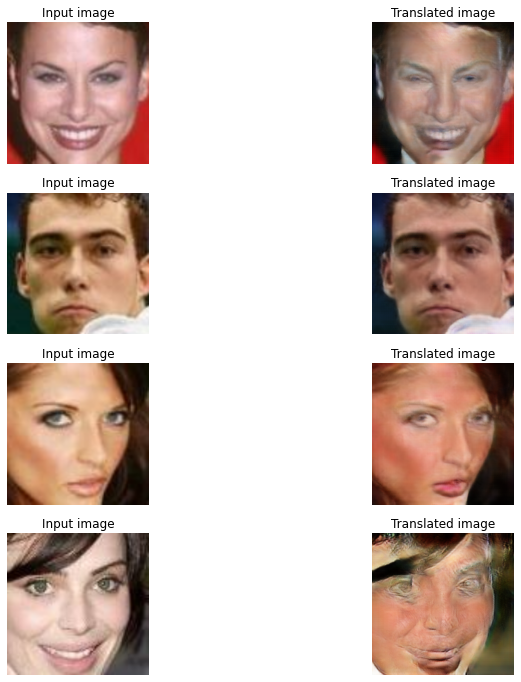

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 19/30
3800/3800 [==============================] - 1362s 358ms/step - G_loss: 2.2499 - F_loss: 1.9289 - D_X_loss: 0.1871 - D_Y_loss: 0.0806


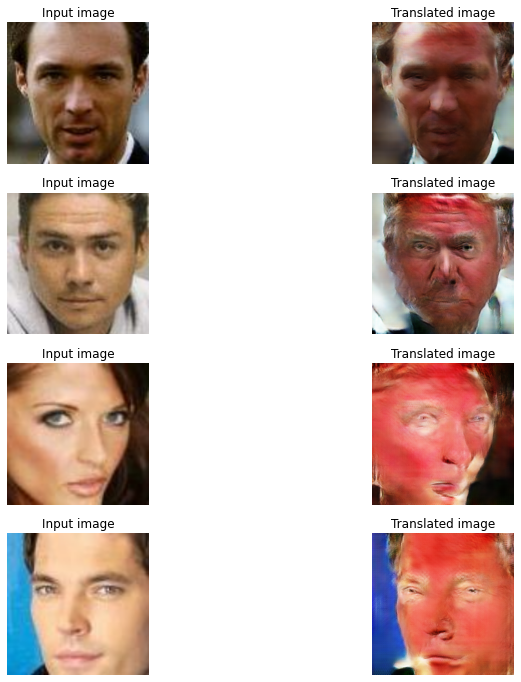

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 20/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.2294 - F_loss: 1.9255 - D_X_loss: 0.1853 - D_Y_loss: 0.0803


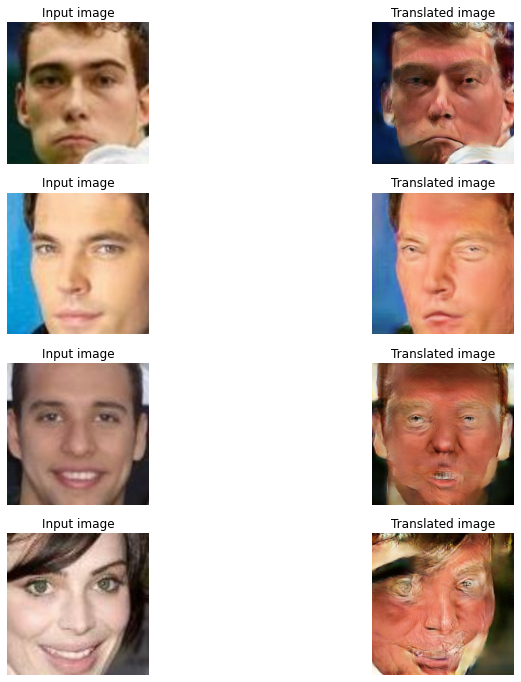

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 21/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.2384 - F_loss: 1.9124 - D_X_loss: 0.1838 - D_Y_loss: 0.0788


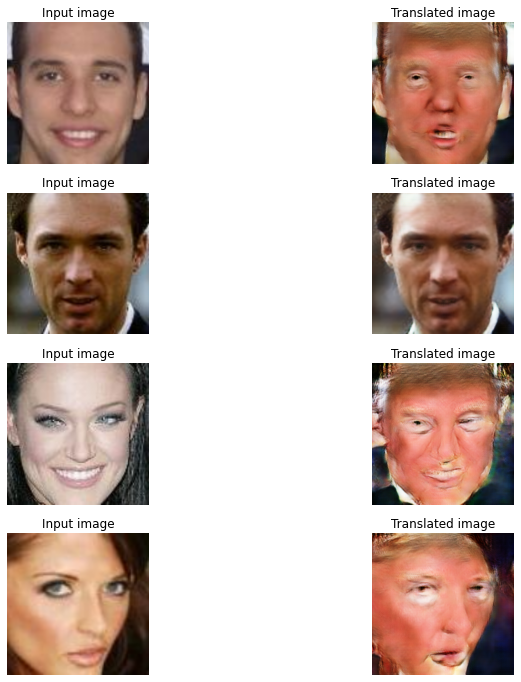

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 22/30
3800/3800 [==============================] - 1362s 358ms/step - G_loss: 2.2265 - F_loss: 1.9409 - D_X_loss: 0.1839 - D_Y_loss: 0.0783


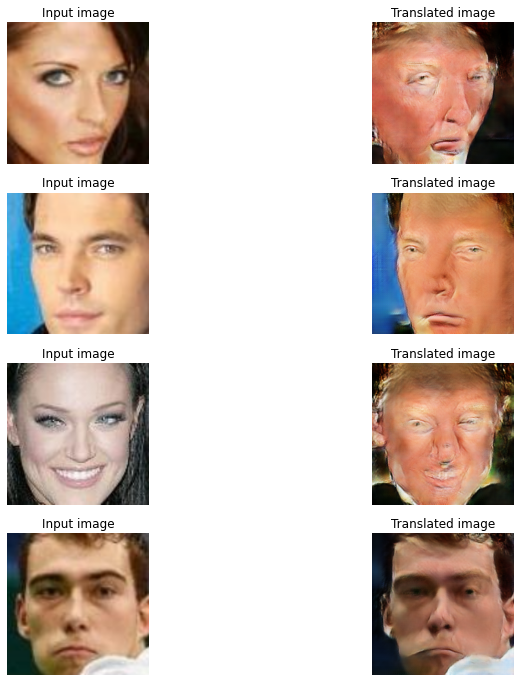

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 23/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.2323 - F_loss: 1.9395 - D_X_loss: 0.1809 - D_Y_loss: 0.0776


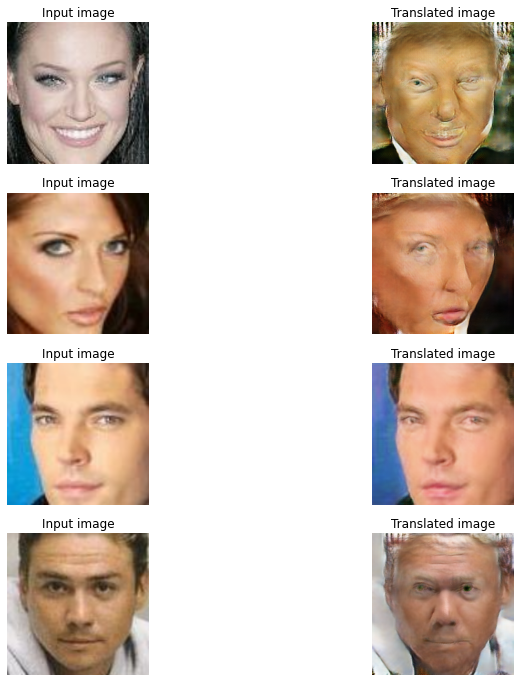

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 24/30
3800/3800 [==============================] - 1361s 358ms/step - G_loss: 2.2237 - F_loss: 1.9644 - D_X_loss: 0.1779 - D_Y_loss: 0.0769


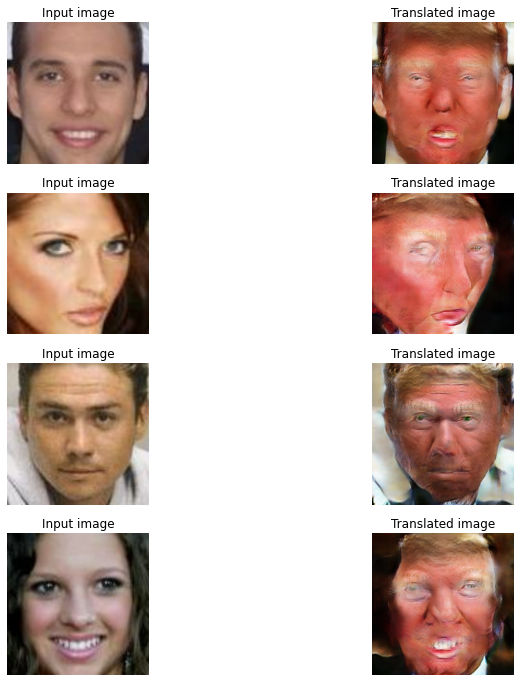

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 25/30
3800/3800 [==============================] - 1362s 358ms/step - G_loss: 2.2274 - F_loss: 1.9511 - D_X_loss: 0.1750 - D_Y_loss: 0.0755


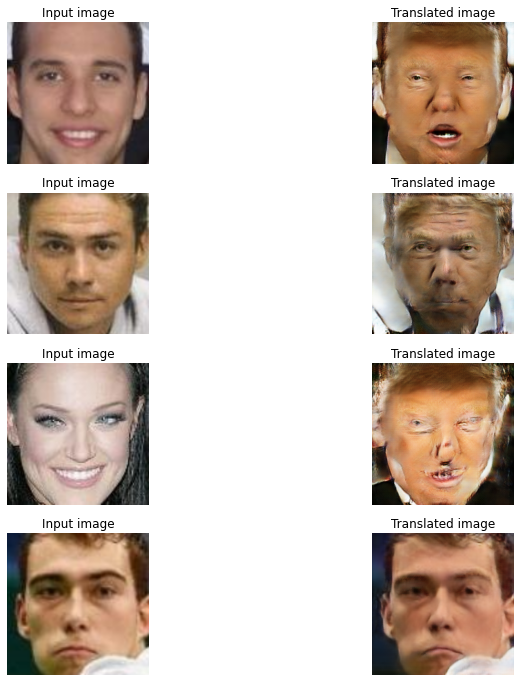

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 26/30
3800/3800 [==============================] - 1362s 358ms/step - G_loss: 2.2254 - F_loss: 1.9479 - D_X_loss: 0.1743 - D_Y_loss: 0.0746


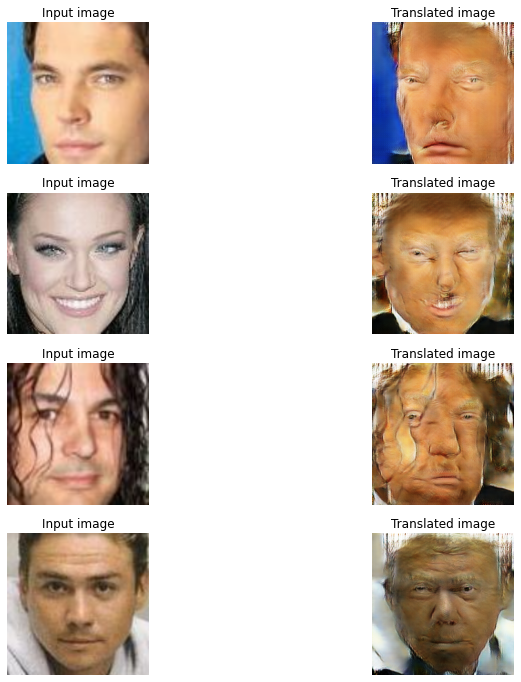

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 27/30
3800/3800 [==============================] - 1363s 359ms/step - G_loss: 2.2310 - F_loss: 1.9800 - D_X_loss: 0.1718 - D_Y_loss: 0.0729


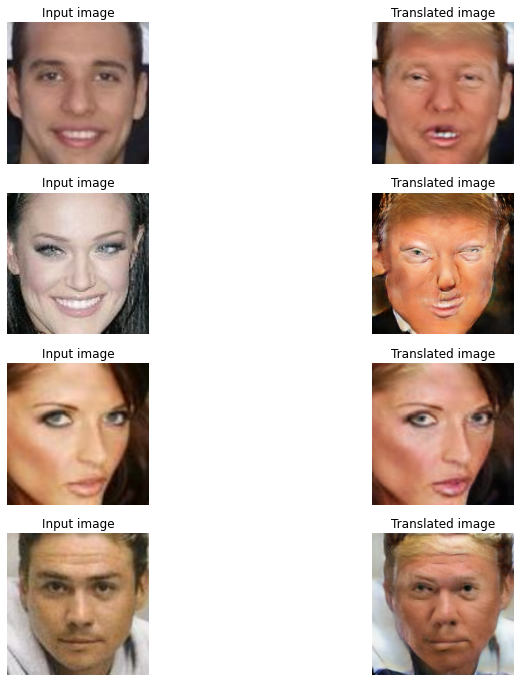

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 28/30
3800/3800 [==============================] - 1363s 359ms/step - G_loss: 2.2075 - F_loss: 1.9745 - D_X_loss: 0.1726 - D_Y_loss: 0.0739


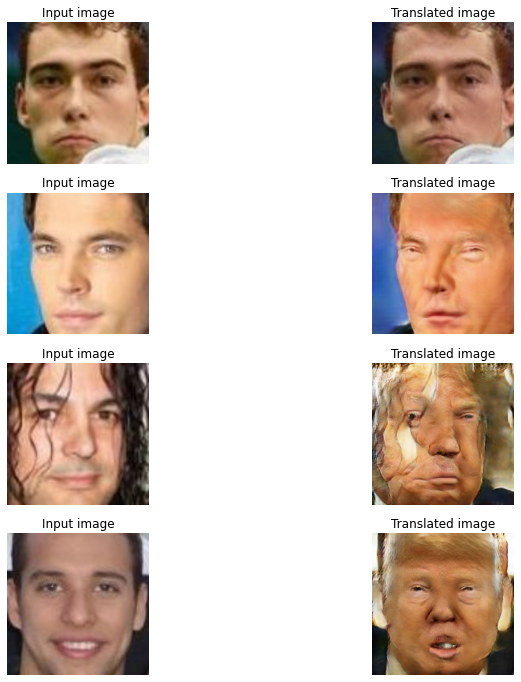

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 29/30
3800/3800 [==============================] - 1362s 358ms/step - G_loss: 2.2086 - F_loss: 1.9964 - D_X_loss: 0.1706 - D_Y_loss: 0.0723


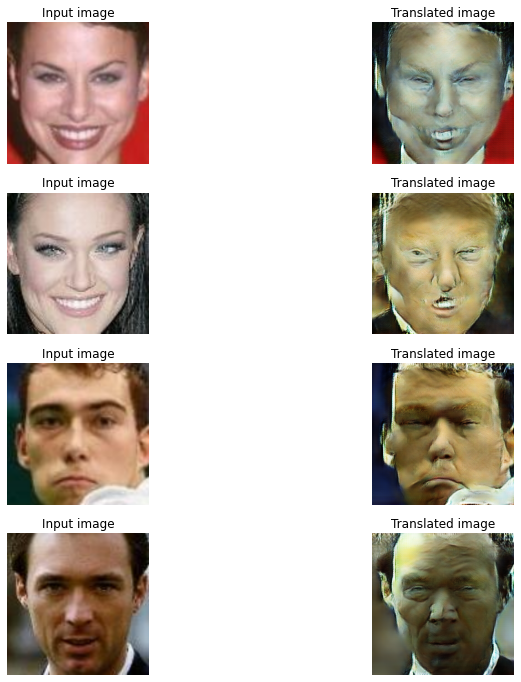

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 30/30
3800/3800 [==============================] - 1363s 359ms/step - G_loss: 2.2220 - F_loss: 1.9783 - D_X_loss: 0.1694 - D_Y_loss: 0.0709


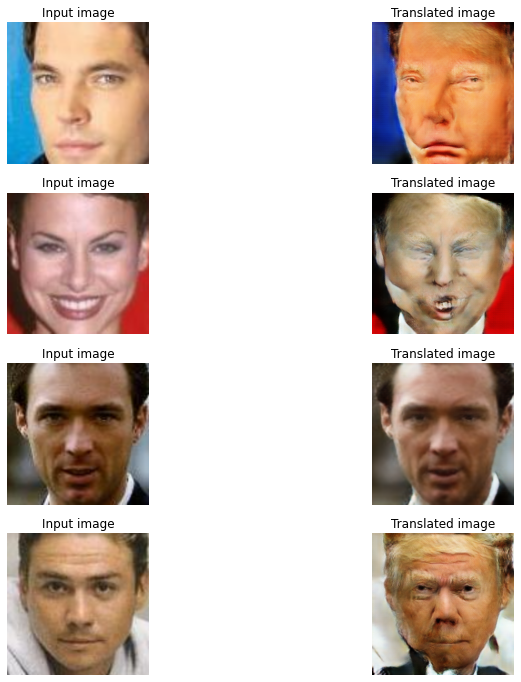

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [13]:
n_epochs = 30

# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath
)

# Train the model
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_celeb, train_trump)),
    epochs=n_epochs,
    callbacks=[plotter, model_checkpoint_callback],
)

<a id="results"></a>
# **3. Results**

While other deep learning achitectures are trained with a loss function until convergece, within a GAN model the generator and discriminator are trained simultaneously to maintain an equilibrium. Hence, we cannot infer the quality of performance solely based on the loss plot. The original paper by Zhu and colleagues, 2017 presented both qualitative and quantitative measures to assess CycleGAN performance based on the quality of generated images. However, we here restrict ourselves to a visual comparison due to (1) limited computational capacity which did not allow us to run the model for over 30 epochs, and (2) time constraints, which did not allow us to perform additional qualitative analyses of our results.  

In comparison to the translated images after our first run (see Disclaimer), our extended preprocessing pipeline using face detection and data augmentation techniques yielded visually better results. The focus on full-face images appears to have allowed our model to learn specifically distinct facial features which is mostly noticeable in the skin tone and hair style in the translated images. 

### **Example images from the training data**

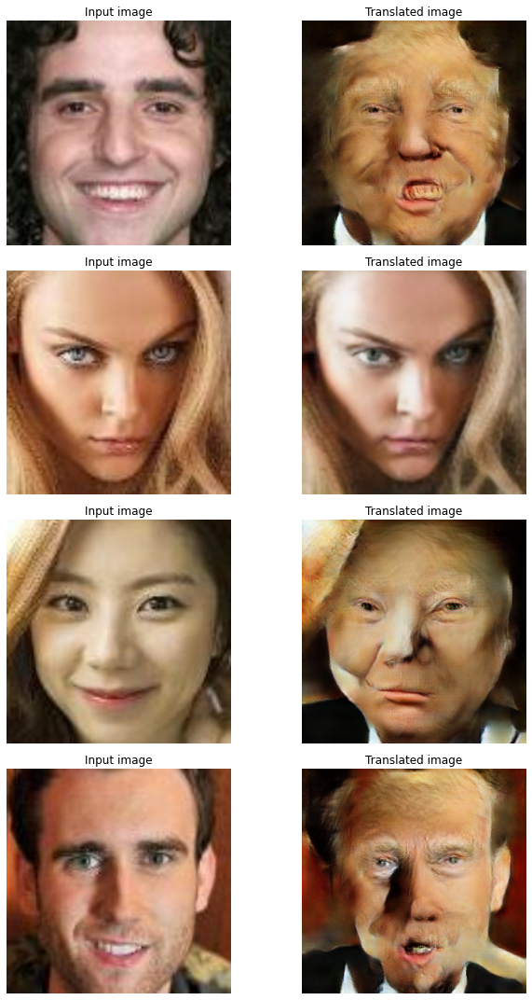

In [14]:
# visualisation
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(train_celeb.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

### **Example images from the validation data** 

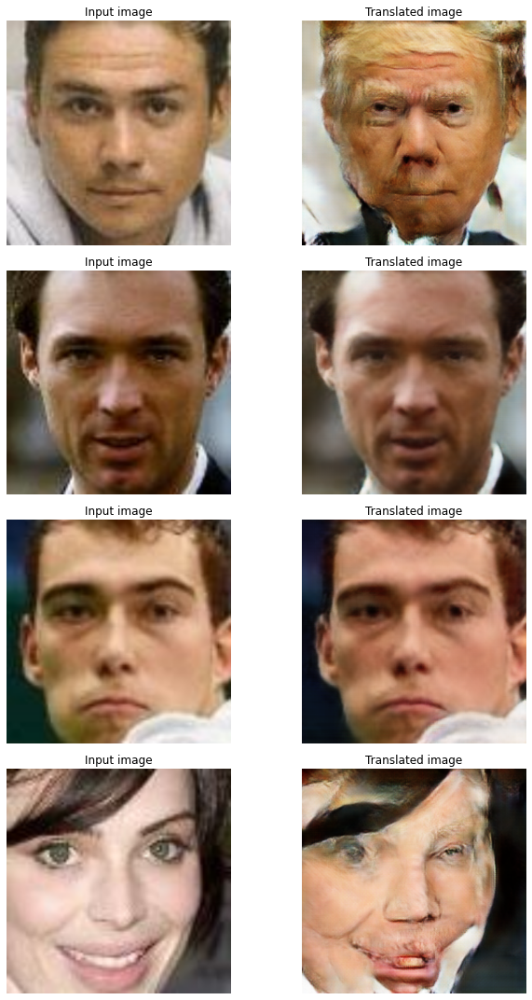

In [15]:
# visualisation
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_celeb.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

### **Loss plot**

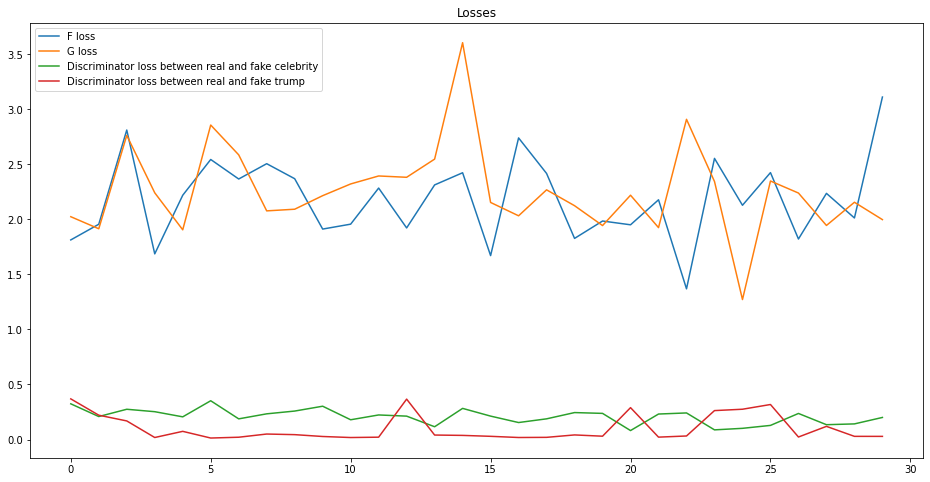

In [16]:
epochs = n_epochs

G_loss = cycle_gan_model.history.history["G_loss"]
F_loss = cycle_gan_model.history.history["F_loss"]

discriminator_X_loss = cycle_gan_model.history.history["D_X_loss"]
discriminator_Y_loss = cycle_gan_model.history.history["D_Y_loss"]

plt.figure(figsize=(16, 8))
plt.plot(range(epochs), F_loss, label='F loss')
plt.plot(range(epochs), G_loss, label='G loss')
plt.plot(range(epochs), discriminator_X_loss, label='Discriminator loss between real and fake celebrity')
plt.plot(range(epochs), discriminator_Y_loss, label='Discriminator loss between real and fake trump')
plt.legend(loc='upper left')
plt.title('Losses')
plt.show()

<a id="conclusion"></a>
# **4. Conclusion & Limitations**

Overall, our extended preprocessing pipeline resulted in visibly better results than when simply using the unstructured Trump dataset. In a limited number of epochs, our model was able to grasp the most prominent trump-like features such as the skin tone and hairstyle. Importantly, this was the case after pre-processing of both data sets - our model would therefore only generalise to same-sized input pictures of faces.

Our results underline the importance of data quality for a specific deep learning task, which has a major impact on model performance. Furthermore, in light of the small number of epochs, our results suggest that the CycleGAN architecture might be able to grasp more subtle features specific to an image domain, given (1) a large enough sample size containing structured images (the exact features we aim to convey), and (2) sufficient computational power. This also highlights the main challenges with which we were faced during this project. Firstly, we had issues finding adequate datasets including a large amount of structured and high-quality samples. Secondly, we did only have access to limited computational capacity and hence were restricted in the number of epochs we could use. Both points mentioned also open up possible approaches for future research: extend the data sets, e.g., by upscaling low-quality samples and/or get access to more computational power to be able to run far more epochs.

On a final note: During this project we were able to (1) apply and extend the knowledge we acquired throughout the course,
(2) dive into a new deep learning architecture, and (3) get acquainted with limitations when handling large amounts of image data. 

# **References**

**Goodfellow, I., Pouget-Abadie, J., Mirza, M., Xu, B., Warde-Farley, D., Ozair, S., Courville, A., & Bengio, Y. (2020).** Generative adversarial networks. *Communications of the ACM*, 63(11), 139–144. https://doi.org/10.1145/3422622

**Liu, Z., Luo, P., Wang, X., & Tang, X. (2015).** Deep Learning Face Attributes in the Wild. *2015 IEEE International Conference on Computer Vision (ICCV)*. https://doi.org/10.1109/iccv.2015.425

**Nain, A. K. (2020, August 12).** *Keras documentation: CycleGAN.* https://keras.io/examples/generative/cyclegan/

**Zhu, J. Y., Park, T., Isola, P., & Efros, A. A. (2017).** Unpaired image-to-image translation using cycle-consistent adversarial networks. *Proceedings of the IEEE international conference on computer vision*, 2223-2232).